# SIR Tuberculosis Simulation and Visualization Project

The population data documentation is found here: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4/documentation

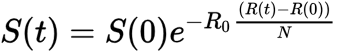

In [1]:
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
from mpl_toolkits.basemap import Basemap
from netCDF4 import Dataset
import numpy as np
from celluloid import Camera
from IPython.display import HTML
from tqdm import tqdm
from IPython.display import Image
import copy

pd.options.display.float_format = "{:,.0f}".format

In [2]:
# Read the data
tb = pd.read_csv("../data/final/tuberculosis.csv")
nationInfo = pd.read_csv("../data/final/nations.txt", sep="\t")
pop = Dataset("../data/final/population-60.nc")

long = pop.variables["longitude"][:]
lat = pop.variables["latitude"][:]

population = {
    "2000": pop.variables[
        "UN WPP-Adjusted Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 1 degree"
    ][0],
    "2005": pop.variables[
        "UN WPP-Adjusted Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 1 degree"
    ][1],
    "2010": pop.variables[
        "UN WPP-Adjusted Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 1 degree"
    ][2],
    "2015": pop.variables[
        "UN WPP-Adjusted Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 1 degree"
    ][3],
    "2020": pop.variables[
        "UN WPP-Adjusted Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 1 degree"
    ][4],
}
nations = pop.variables[
    "UN WPP-Adjusted Population Count, v4.11 (2000, 2005, 2010, 2015, 2020): 1 degree"
][10]

In [3]:
# Get Nation Data
nationData = tb[tb["Year"].isin([2000, 2005, 2010, 2015, 2020])]
nationData["Population"] = 0

for i in range(0, nations.shape[0]):
    for j in range(0, nations.shape[1]):
        cord2Nation = nationInfo[nationInfo["Value"] == nations[i, j]]
        if not cord2Nation.empty:
            nationData.loc[
                (nationData["Code"] == cord2Nation["ISOCODE"].values[0])
                & (nationData["Year"] == 2000),
                "Population",
            ] += population["2000"][i, j]

            nationData.loc[
                (nationData["Code"] == cord2Nation["ISOCODE"].values[0])
                & (nationData["Year"] == 2005),
                "Population",
            ] += population["2005"][i, j]

            nationData.loc[
                (nationData["Code"] == cord2Nation["ISOCODE"].values[0])
                & (nationData["Year"] == 2010),
                "Population",
            ] += population["2010"][i, j]

            nationData.loc[
                (nationData["Code"] == cord2Nation["ISOCODE"].values[0])
                & (nationData["Year"] == 2015),
                "Population",
            ] += population["2015"][i, j]

            nationData.loc[
                (nationData["Code"] == cord2Nation["ISOCODE"].values[0])
                & (nationData["Year"] == 2020),
                "Population",
            ] += population["2020"][i, j]

/var/folders/1_/hrpgcd7x7tl2_345fm6y6qzc0000gn/T/ipykernel_16333/1945669112.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nationData["Population"] = 0


In [4]:
nationData = nationData[nationData["Population"] > 0]
nationData = nationData.astype({"Incidences": "float64", "Population": "float64"})
nationData["Cases per 1M"] = nationData["Incidences"] / nationData["Population"] * 1e6

In [5]:
class cell:

    Sus = 0
    Inf = 0
    Rem = 0
    nation = "NaN"

    def populate(self, population, tbRatio, nation) -> None:
        self.Inf = population * tbRatio / 1e6
        self.Sus = population - self.Inf
        self.Rem = 0
        self.nation = nation

    def step(self, r0, gamma=1) -> None:
        N = self.Sus + self.Inf + self.Rem
        if N != 0:
            Sus = self.Sus - r0 * self.Sus * self.Inf / N
            Inf = self.Inf + (r0 * self.Sus / N - gamma) * self.Inf
            Rem = self.Rem + gamma * self.Inf
            self.Sus = max(0, Sus)
            self.Inf = max(0, Inf)
            self.Rem = max(0, Rem)

    def __str__(self) -> str:
        return f"{self.nation}: {sum([self.Sus, self.Inf, self.Rem])}"

    def __repr__(self) -> str:
        return f"{self.nation}: {sum([self.Sus, self.Inf, self.Rem])}"

    def copy(self):
        return copy.deepcopy(self)

In [6]:
# Create Earth
def createEarth(year):
    earth = np.zeros(
        (population[year].shape[0], population[year].shape[1]), dtype=object
    )
    for i in range(0, earth.shape[0]):
        for j in range(0, earth.shape[1]):
            earth[i, j] = cell()
            if (
                population[year][i, j] == 0
                or nationInfo[nationInfo["Value"] == nations[i, j]].empty
            ):
                continue
            nationCode = nationInfo[nationInfo["Value"] == nations[i, j]][
                "ISOCODE"
            ].values[0]
            try:
                cases = nationData[
                    (nationData["Code"] == nationCode)
                    & (nationData["Year"] == int(year))
                ]["Cases per 1M"].values[0]
            except:
                cases = 0
            earth[i, j].populate(population[year][i, j], cases, nationCode)
    return earth


earth = {
    "2000": createEarth("2000"),
    "2005": createEarth("2005"),
    "2010": createEarth("2010"),
    "2015": createEarth("2015"),
    "2020": createEarth("2020"),
}

In [7]:
def extract(cell) -> float:
    if cell == 0 or cell.Inf == 0:
        # print(cell.nation, cell.Inf)
        return 0.0
    return cell.Inf + 1


extractVector = np.vectorize(extract)


def modelCopy(model) -> np.ndarray:
    new = np.zeros(model.shape, dtype=object)
    for i in range(0, model.shape[0]):
        for j in range(0, model.shape[1]):
            new[i, j] = model[i, j].copy()
    return new

### TB Distribution over the Earth

Based on the TB data, the cases are evenly distributed by a nations TB ratio. This means areas of higher population have more cases. This graph is for 2020.

/usr/local/lib/python3.11/site-packages/numpy/lib/function_base.py:2415: UserWarning: Warning: converting a masked element to nan.
  res = asanyarray(outputs, dtype=otypes[0])


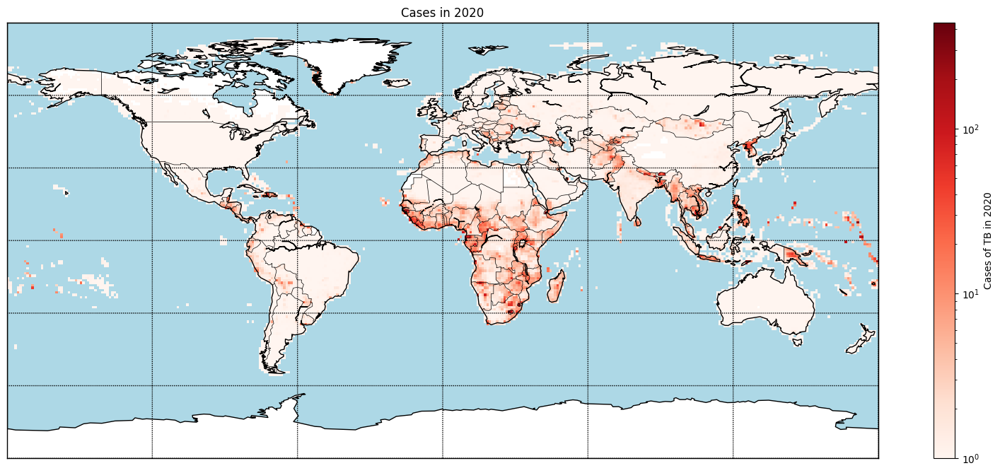

In [8]:
fig = plt.figure(figsize=(20, 8))
m = Basemap()
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color="lightblue")
m.fillcontinents(color="white", lake_color="lightblue")
m.drawparallels(np.arange(-90, 90, 30))
m.drawmeridians(np.arange(-180, 180, 60))

# Plot the data
x, y = m(*np.meshgrid(long, lat))

m.pcolormesh(x, y, extractVector(earth["2020"]), cmap="Reds", norm=mpl.colors.LogNorm())

# Add a colorbar
plt.colorbar(label="Cases of TB in 2020")
plt.title("Cases in 2020")

# Show the map
plt.show()

Here are the same diagram but stacked for 2000, 2005, 2010, 2015 and 2020.

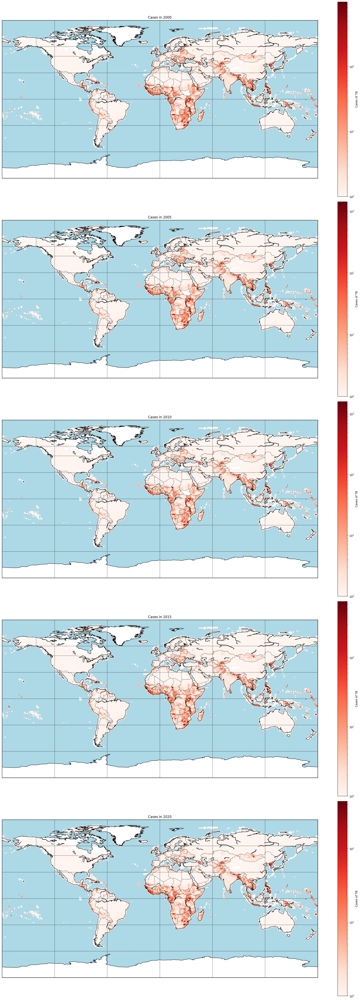

In [9]:
fig = plt.figure(figsize=(20, 50))

i = 0
for data in earth.keys():
    i += 1
    subplot = fig.add_subplot(5, 1, i)
    subplot.set_title(f"Cases in {data}")
    m = Basemap()
    m.drawcoastlines()
    m.drawcountries()
    m.drawmapboundary(fill_color="lightblue")
    m.fillcontinents(color="white", lake_color="lightblue")
    m.drawparallels(np.arange(-90, 90, 30))
    m.drawmeridians(np.arange(-180, 180, 60))

    # Plot the data
    x, y = m(*np.meshgrid(long, lat))

    m.pcolormesh(
        x, y, extractVector(earth[data]), cmap="Reds", norm=mpl.colors.LogNorm()
    )
    plt.colorbar(label="Cases of TB")

# Show the map
plt.tight_layout()
plt.show()

## Simulation of Novel TB using the SIR Model

Estimates of the reproduction number and recovery number:

- Reproduction number, $r_0$ = 2.1
- Recovery Numbeer, $\gamma_0$ = 0.346 [^fn]

><cite>Ma Y, Horsburgh CR, White LF, Jenkins HE. Quantifying TB transmission: a systematic review of reproduction number and serial interval estimates for tuberculosis. Epidemiol Infect. 2018 Sep;146(12):1478-1494. doi: 10.1017/S0950268818001760. Epub 2018 Jul 4. PMID: 29970199; PMCID: PMC6092233.</cite>

><cite>Adeyemo S, Sangotola A, Korosteleva O. Modeling Transmission Dynamics of Tuberculosis-HIV Co-Infection in South Africa. Epidemiologia (Basel). 2023 Oct 10;4(4):408-419. doi: 10.3390/epidemiologia4040036. PMID: 37873885; PMCID: PMC10594517.</cite>

In [32]:
def runStep(earth, r0, gamma):
    for i in range(0, earth.shape[0]):
        for j in range(0, earth.shape[1]):
            earth[i, j].step(r0, gamma)
    return earth


def visuliseSIR(earthModel, sweeps, show="Inf"):
    model = modelCopy(earthModel)
    fig = plt.figure(figsize=(20, 10))
    cam = Camera(fig)

    for i in tqdm(range(sweeps)):
        m = Basemap()
        m.drawcoastlines()
        m.drawcountries()
        m.drawmapboundary()
        m.fillcontinents(color="white", lake_color="white")

        x, y = m(*np.meshgrid(long, lat))
        m.pcolormesh(
            x,
            y,
            extractVector(model),
            cmap="Reds",
            norm=mpl.colors.LogNorm(),
            # vmin=0.1,
            # vmax=1000,
        )
        cam.snap()

        model = runStep(model, 2.1, 0.346)

    return cam.animate(blit=True)


# HTML(visuliseSIR(earth["2015"], 100).to_html5_video())
visuliseSIR(earth["2015"], 100).save("SIR Model.gif", writer="pillow", fps=5)
plt.close()

  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.11/site-packages/numpy/lib/function_base.py:2415: UserWarning: Warning: converting a masked element to nan.
  res = asanyarray(outputs, dtype=otypes[0])
100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


### Novel TB on Earth based on 2020 TB Incidences

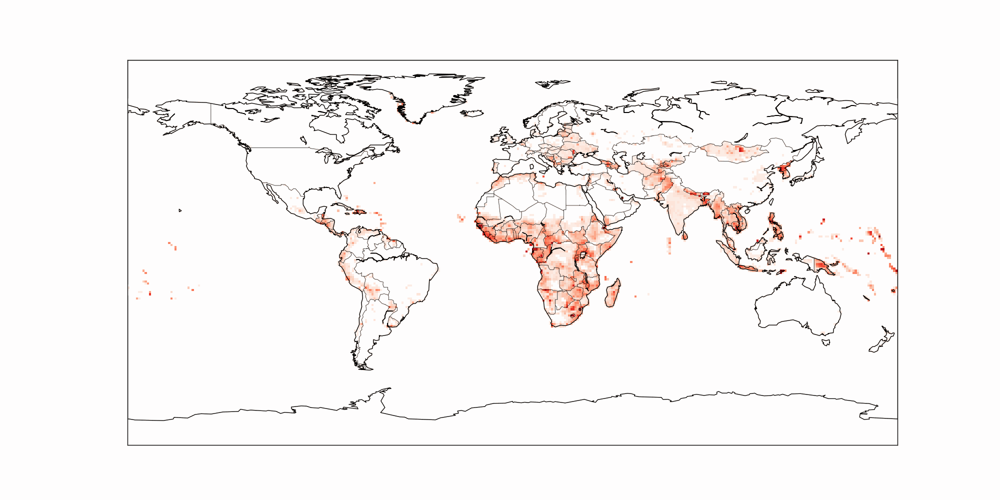

In [33]:
Image("SIR Model 2020.gif")

### S I R Totals over time for entire Earth

100%|██████████| 50/50 [00:09<00:00,  5.41it/s]


[7757917571.841086, 7757874887.004615, 7757757669.451932, 7757437277.643414, 7756569782.246983, 7754249109.361259, 7748095804.303127, 7731993362.925898, 7691303150.150024, 7595450356.811169, 7378961976.752098, 6921393423.1663, 6116514140.145099, 5056078306.274333, 3910082880.7252245, 2775945974.0742707, 1324521670.848875, 486283336.1723535, 186597771.9641399, 46340329.722337484, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833, 29402716.243419833]


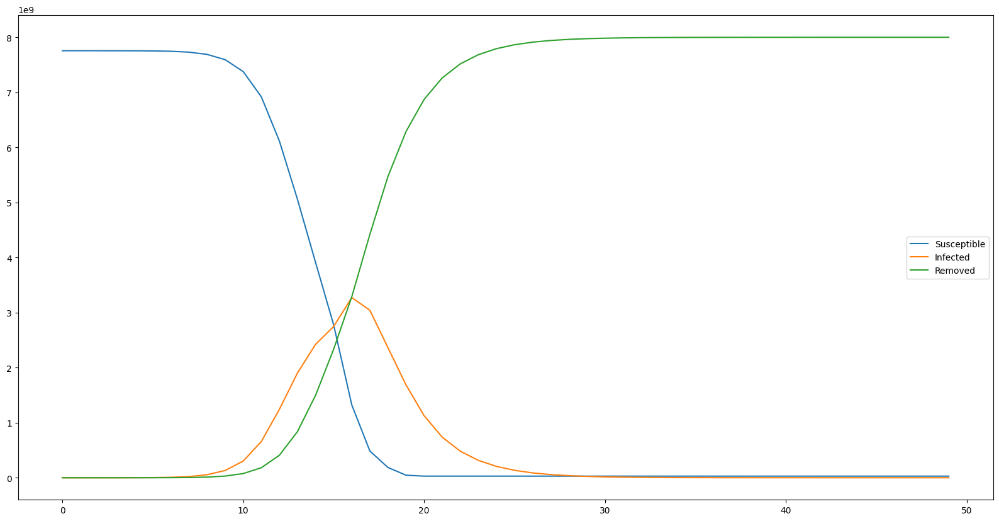

In [31]:
def sumModel(model, func):
    sum = 0
    # print(model[50, 90].Sus, model[50, 90].Inf, model[50, 90].Rem)
    for c in model.flatten():
        if type(func(c)) not in [float, int, np.float64]:
            # print(type(func(c)), func(c), float(func(c)))
            continue
        if float(func(c)) < 0:
            print(func(c))
        sum += float(func(c))
    return sum


def graphSIR(earthModel, sweeps, r0=3.4, gamma=0.346):
    model = modelCopy(earthModel)
    fig = plt.figure(figsize=(20, 10))

    susceptible = []
    infected = []
    removed = []
    for i in tqdm(range(sweeps)):
        susceptible.append(sumModel(model, lambda c: c.Sus))
        infected.append(sumModel(model, lambda c: c.Inf))
        removed.append(sumModel(model, lambda c: c.Rem))

        model = runStep(model, r0, gamma)

    print(susceptible)
    plt.plot(susceptible, label="Susceptible")
    plt.plot(infected, label="Infected")
    plt.plot(removed, label="Removed")

    plt.legend()
    plt.show()


graphSIR(earth["2020"], 50, 2.1)